### Deep Reinforcement Learning on SnL


In [4]:
# imports!!

## gym
import gym
from gym import spaces

## rest
import random
import numpy as np
import pickle
from tqdm import tqdm
from snl_gym_environment import SNL_env
import os

#### board test

1. Board Initialization

In [5]:
# Snl Board tests
board = SnlBoard(printing=True)
initital_state = np.concatenate( ( np.array([np.random.randint(0,6)]),np.zeros((2,3)).flatten() ) )

# perform reset
print('\n','**inital state** :',initital_state,'\n')
board.reset(initital_state)


 **inital state** : [0. 0. 0. 0. 0. 0. 0.] 

################################
environment state:
die value :1.0
board state :
[[0. 0. 0.]
 [0. 0. 0.]]
player 1 init:  <__main__.Player object at 0x127221370>
player 2 init:  <__main__.Player object at 0x127221eb0>
################################


2. Perform a step action

In [6]:
# perform step function
random_action = np.random.randint(0,3)
print('\nrandom_action : ',random_action)
step_result = board.perform_step(random_action)

print(step_result)

game_fin = step_result[2]



random_action :  2
######P1
action : 2
die:  1.0
board state:  [0. 0. 1. 0. 0. 0.]
p1 score:  1.0
p1 token positions:  [0. 0. 1.]
action type:  VALID


######P2
die:  6
board state:  [0. 0. 1. 0. 6. 0.]
p2 score:  6.0
p2 token positions:  [0. 6. 0.]


(array([2., 0., 0., 1., 0., 6., 0.]), -1.25, False, {})


3. Run a full Game

In [7]:
# perform a game loop
while not game_fin: # game finished state
    random_action = np.random.randint(0,3)
    print('\nrandom_action : ',random_action)
    step_result = board.perform_step(random_action)
    print(step_result)
    print('################################################################')
    game_fin = step_result[2]


random_action :  2
######P1
action : 2
die:  3
board state:  [0. 0. 4. 0. 6. 0.]
p1 score:  4.0
p1 token positions:  [0. 0. 4.]
action type:  VALID


######P2
die:  5
board state:  [0. 0. 4. 5. 6. 0.]
p2 score:  11.0
p2 token positions:  [5. 6. 0.]


(array([1., 0., 0., 4., 5., 6., 0.]), -1.75, False, {})
################################################################

random_action :  0
######P1
action : 0
die:  2
board state:  [2. 0. 4. 5. 6. 0.]
p1 score:  6.0
p1 token positions:  [2. 0. 4.]
action type:  VALID


######P2
die:  1
board state:  [2. 0. 4. 6. 6. 0.]
p2 score:  12.0
p2 token positions:  [6. 6. 0.]


(array([0., 2., 0., 4., 6., 6., 0.]), -1.5, False, {})
################################################################

random_action :  1
######P1
action : 1
die:  1
board state:  [2. 1. 4. 6. 6. 0.]
p1 score:  7.0
p1 token positions:  [2. 1. 4.]
action type:  VALID


######P2
die:  1
board state:  [ 2.  1.  4. 53.  6.  0.]
p2 score:  59.0
p2 token positions:  [53.  6.  

In [5]:
import gym
import numpy as np
from gym import spaces


class SNL_env(gym.Env):
    """Custom Environment that follows gym interface."""

    metadata = {"render.modes": ["human"]}

    def __init__(self, printing=False):
        super().__init__()
        # Define action and observation space
        # They must be gym.spaces objects
        # Example when using discrete actions:
        self.action_space = spaces.Discrete(3)
        
        ## 8 [total tokens] * 100 [positions]
        self.observation_space = spaces.MultiDiscrete([6]+[101 for _ in range(0, 6)])
        self.SNLBoard = SnlBoard(printing)
        

    def step(self, action):
        # player 1 plays
        # player 2 plays
        # new state is observed
        # reward is calculated
        # check if game is completed
        # info is optional
        
        observation, reward, done, info = self.SNLBoard.perform_step(action)
        
        return observation, reward, done, info

    def reset(self):
        # initializing state
        state = np.concatenate(([np.random.randint(0,6)],np.zeros(shape=(2,3)).flatten()))
        
        # reset board | set inital state
        self.SNLBoard.reset(state)
        
        return state
    

    def render(self, mode='console'):
        if mode != 'console':
            raise NotImplementedError()
        
        return self.SNLBoard.game_end_info()
        

In [6]:
from stable_baselines3 import A2C,PPO
from sb3_contrib import RecurrentPPO
from stable_baselines3.common.env_checker import check_env
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.results_plotter import load_results, ts2xy
import os


# Instantiate the env
env = SNL_env()
# check environment validity
check_env(env, warn=True)

/Users/kalpriksh/code/.venv/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
from keras.models import Sequential
from keras.layers import Dense, InputLayer

2023-03-03 17:25:05.421393: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [33]:
log_dir = "./tmp/gym/custom/"
os.makedirs(log_dir, exist_ok=True)

# Create and wrap the environment
env = SNL_env()
# Logs will be saved in log_dir/monitor.csv
env = Monitor(env, log_dir)

In [34]:
discount_factor = 0.95
eps = 0.3
eps_decay_factor = 0.999
num_episodes=1000

In [35]:
model = Sequential()
model.add(InputLayer(batch_input_shape=(1, 7)))
model.add(Dense(20, activation='relu'))
model.add(Dense(10, activation='relu'))
model.add(Dense(5, activation='relu'))
model.add(Dense(3, activation='linear'))
model.compile(loss='mse', optimizer='adam', metrics=['mae'])

In [36]:
OBSERVATION_SPACE_LENGTH = 7
ACTION_SPACE_LENGTH = 3

for i in range(num_episodes):
    
    state = env.reset()
    eps *= eps_decay_factor
    done = False
    
    while not done:
        if np.random.random() < eps: 
            action = np.random.randint(0, ACTION_SPACE_LENGTH)            
        else:
            action = np.argmax(model.predict(state.reshape(1,7)))
        

        new_state, reward, done, _ = env.step(action)

        target = reward + discount_factor * np.max( model.predict(new_state.reshape(1,7)) )

        target_vector = model.predict(state.reshape(1,7))[0]
      
        target_vector[action] = target
        
        model.fit(state.reshape(1,7), target_vector.reshape(-1, ACTION_SPACE_LENGTH), epochs=1, verbose=0)
        
        state = new_state

1/1 [==============================] - 0s 24ms/step


In [37]:
model.save('.DQN/')

INFO:tensorflow:Assets written to: .DQN/assets


INFO:tensorflow:Assets written to: .DQN/assets


In [22]:
env=SNL_env(printing=True)
obs = env.reset()

p1_wins = 0
p2_wins = 0
ties = 0
for i in range(18000):
    action = model.predict(obs.reshape(1,7))
    action = np.argmax(action)
    
    obs, rewards, dones, info = env.step(action)
    
    env.render(mode='console')
    #print(dones)
    if dones:
        info = env.render()
        if(info['p1_won']):
            p1_wins += 1
        if(info['p2_won']):
            p2_wins += 1
        if(info['tie']):
            ties += 1
        obs = env.reset()
        # print('p1_wins',p1_wins)
        # print('p2_wins',p2_wins)
        # print('ties',ties)
        # print("-----------")

print('p1_wins',p1_wins)
print('p2_wins',p2_wins)
print('ties',ties)
print("-----------")

################################
environment state:
die value :5.0
board state :
[[0. 0. 0.]
 [0. 0. 0.]]
player 1 init:  <__main__.Player object at 0x1665c3fd0>
player 2 init:  <__main__.Player object at 0x1665c3040>
################################
1/1 [==============================] - 0s 27ms/step
######P1
action : 2
die:  5.0
board state:  [0. 0. 5. 0. 0. 0.]
p1 score:  5.0
p1 token positions:  [0. 0. 5.]
action type:  VALID


######P2
die:  5
board state:  [0. 0. 0. 5. 0. 0.]
p2 score:  5.0
p2 token positions:  [5. 0. 0.]


1/1 [==============================] - 0s 26ms/step
######P1
action : 0
die:  1
board state:  [1. 0. 0. 5. 0. 0.]
p1 score:  1.0
p1 token positions:  [1. 0. 0.]
action type:  VALID


######P2
die:  4
board state:  [1. 0. 0. 5. 4. 0.]
p2 score:  9.0
p2 token positions:  [5. 4. 0.]


1/1 [==============================] - 0s 26ms/step
######P1
action : 2
die:  6
board state:  [1. 0. 6. 5. 4. 0.]
p1 score:  7.0
p1 token positions:  [1. 0. 6.]
action type:  VALID


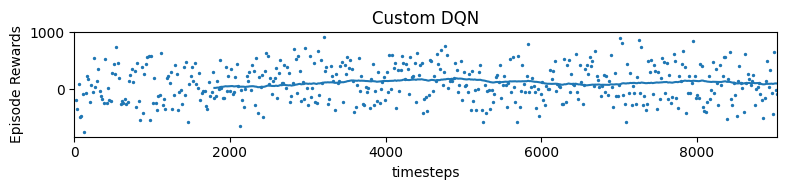

In [24]:
from stable_baselines3.common import results_plotter

# Helper from the library
results_plotter.plot_results([log_dir], 1e5, results_plotter.X_TIMESTEPS, "Custom DQN")

In [28]:
import matplotlib.pyplot as plt
import seaborn as sb
def moving_average(values, window):
    """
    Smooth values by doing a moving average
    :param values: (numpy array)
    :param window: (int)
    :return: (numpy array)
    """
    weights = np.repeat(1.0, window) / window
    return np.convolve(values, weights, 'valid')


def plot_results(log_folder, title='Learning Curve'):
    """
    plot the results

    :param log_folder: (str) the save location of the results to plot
    :param title: (str) the title of the task to plot
    """
    x, y = ts2xy(load_results(log_folder), 'timesteps')
    y = moving_average(y, window=50)
    # Truncate x
    x = x[len(x) - len(y):]

    fig = plt.figure(title)
    plt.plot(x, y)
    plt.xlabel('Number of Timesteps')
    plt.ylabel('Rewards')
    plt.title(title + " Smoothed")
    plt.show()


In [32]:
plot_results('./tmp/gym/')

ValueError: v cannot be empty

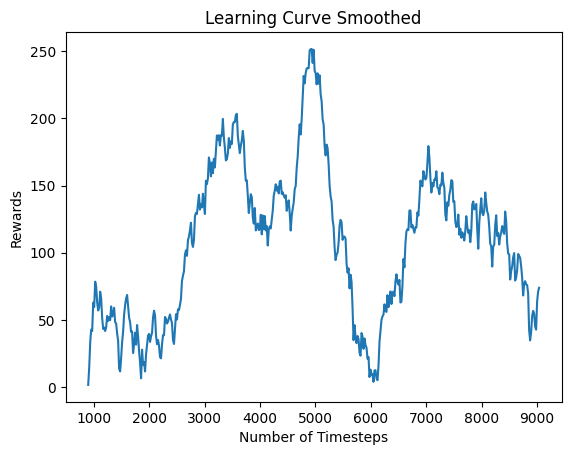

In [29]:
plot_results(log_dir)

#### Modeling [stable baselines]

In [5]:
# Create log dir
log_dir = "./tmp/gym/"
os.makedirs(log_dir, exist_ok=True)

# Create and wrap the environment
env = SNL_env
# Logs will be saved in log_dir/monitor.csv
env = Monitor(env, log_dir)

NameError: name 'Monitor' is not defined

In [16]:
# Instantiate the env
env = SNL_env()
# Define and Train the agent
model = A2C(policy='MlpPolicy',env=env).learn(total_timesteps=1000000)
model.save("A2CMlP")

In [205]:
# Instantiate the env
env = SNL_env()
# Define and Train the agent
model = RecurrentPPO(policy='MlpLstmPolicy',env=env).learn(total_timesteps=1000000)
model.save("RecurrentPPO")

In [185]:
# Instantiate the env
env = SNL_env()
# Define and Train the agent
model = PPO(policy='MlpPolicy',env=env).learn(total_timesteps=1000000)
model.save("PPO")

In [11]:
model = A2C.load('./A2CMlP.zip')

In [12]:
env=SNL_env(printing=True)
obs = env.reset()

p1_wins = 0
p2_wins = 0
ties = 0
for i in range(18000):
    action, _states = model.predict(obs)
    print(action)
    obs, rewards, dones, info = env.step(action)
    env.render(mode='console')
    #print(dones)
    if dones:
        info = env.render()
        if(info['p1_won']):
            p1_wins += 1
        if(info['p2_won']):
            p2_wins += 1
        if(info['tie']):
            ties += 1
        obs = env.reset()
        # print('p1_wins',p1_wins)
        # print('p2_wins',p2_wins)
        # print('ties',ties)
        # print("-----------")

print('p1_wins',p1_wins)
print('p2_wins',p2_wins)
print('ties',ties)
print("-----------")

################################
environment state:
die value :4.0
board state :
[[0. 0. 0.]
 [0. 0. 0.]]
player 1 init:  <__main__.Player object at 0x132e82070>
player 2 init:  <__main__.Player object at 0x132e820a0>
################################
1
######P1
action : 1
die:  4.0
board state:  [0. 4. 0. 0. 0. 0.]
p1 score:  4.0
p1 token positions:  [0. 4. 0.]
action type:  VALID


######P2
die:  3
board state:  [ 0.  4.  0.  0.  0. 84.]
p2 score:  84.0
p2 token positions:  [ 0.  0. 84.]


1
######P1
action : 1
die:  6
board state:  [ 0. 10.  0.  0.  0. 84.]
p1 score:  10.0
p1 token positions:  [ 0. 10.  0.]
action type:  VALID


######P2
die:  1
board state:  [ 0. 10.  0.  1.  0. 84.]
p2 score:  85.0
p2 token positions:  [ 1.  0. 84.]


0
######P1
action : 0
die:  6
board state:  [ 6. 10.  0.  1.  0. 84.]
p1 score:  16.0
p1 token positions:  [ 6. 10.  0.]
action type:  VALID


######P2
die:  1
board state:  [ 6. 10.  0.  1.  0. 85.]
p2 score:  86.0
p2 token positions:  [ 1.  0. 85.]


In [14]:
from stable_baselines3.common import results_plotter

# Helper from the library
results_plotter.plot_results([log_dir], 1e5, results_plotter.X_TIMESTEPS, "TD3 LunarLander")

IndexError: index -1 is out of bounds for axis 0 with size 0

<Figure size 800x200 with 0 Axes>